# Introduction

I choose the Kaggle Competition **[Cassava Leaf Disease Classification competition](https://www.kaggle.com/c/cassava-leaf-disease-classification)** because I think that if an effective model is developed, it will have a huge impact on farmers in Africa. The model should be able to classify 4 different diseases based on the pictures of the leaves. The fifth category is intended to classify healthy leaves.   

Farmers may be able to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage. As an added challenge, effective solutions for farmers must perform well under significant constraints, since African farmers may only have access to mobile-quality cameras with low-bandwidth.

Submissions will be evaluated based on their categorization accuracy.



## Categories  

"0": "Cassava Bacterial Blight (CBB)",   
"1": "Cassava Brown Streak Disease (CBSD)",   
"2": "Cassava Green Mottle (CGM)",   
"3": "Cassava Mosaic Disease (CMD)",   
"4": "Healthy"    


# Set up environment

In [1]:
import math, re, os
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import cv2
from PIL import Image
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout, Activation
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from functools import partial
from sklearn.model_selection import train_test_split
print("Tensorflow version " + tf.__version__)



Tensorflow version 2.1.0


# Set up variables

In [2]:
batch_size = 64
image_size = 224 #needed for VGG16
classes = ['0', '1', '2', '3', '4']
epochs = 10

"""
model = VGG16(
    include_top=True,
    weights='imagenet',
    input_shape=(image_size, image_size, 3)
)

model.summary()
"""

"\nmodel = VGG16(\n    include_top=True,\n    weights='imagenet',\n    input_shape=(image_size, image_size, 3)\n)\n\nmodel.summary()\n"

# Load the data


In [3]:
# load data and categories & first sight on this data

path = '../cassava-leaf-disease-classification'

train_images = os.listdir(os.path.join(path, "train_images"))
print("Total images for Train: ", len(train_images))

with open ('../cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    classes = json.loads(file.read())
    
print(json.dumps(classes,indent=4))

df_train = pd.read_csv(os.path.join(path, "train.csv"))
df_train.head()

df_train['class'] = df_train['label'].map({int(i) : c for i, c in classes.items()}) 

df_train.head()


Total images for Train:  21397
{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


,image_id,label,class
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


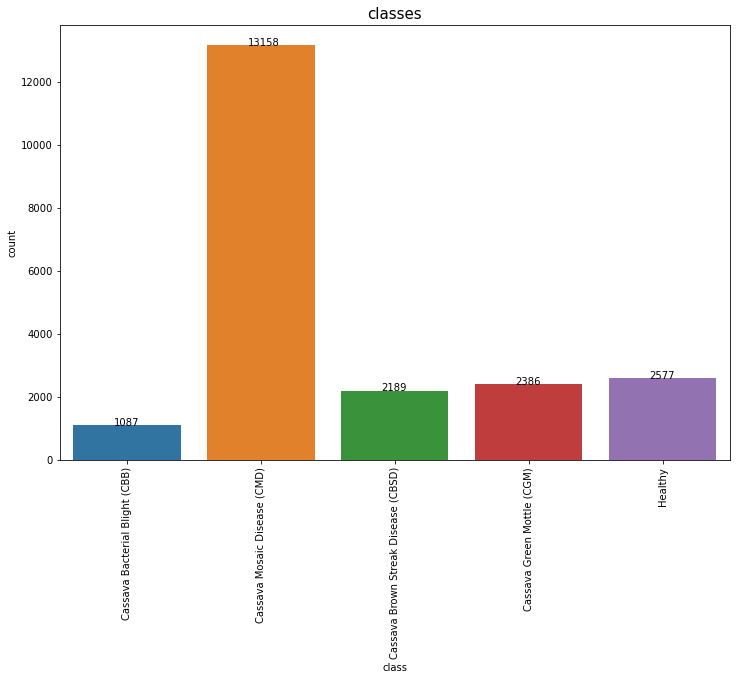

In [4]:
# plot the categories/classes to visualize the distribution

plt.subplots(figsize=(12,8))
ax  = sns.countplot(x='class', data=df_train)

for a in ax.patches:
        ax.annotate('{:1}'.format(a.get_height()),
                    (a.get_x()+0.3, a.get_height()))
plt.xticks(rotation=90)
ax.set_title("classes", fontdict={'fontsize':15})
plt.show();

The plot shows us, that we have a unbalanced data set. 

['1707820452.jpg', '4175366577.jpg', '4009427061.jpg', '1753806581.jpg', '2619839931.jpg', '3788644413.jpg']


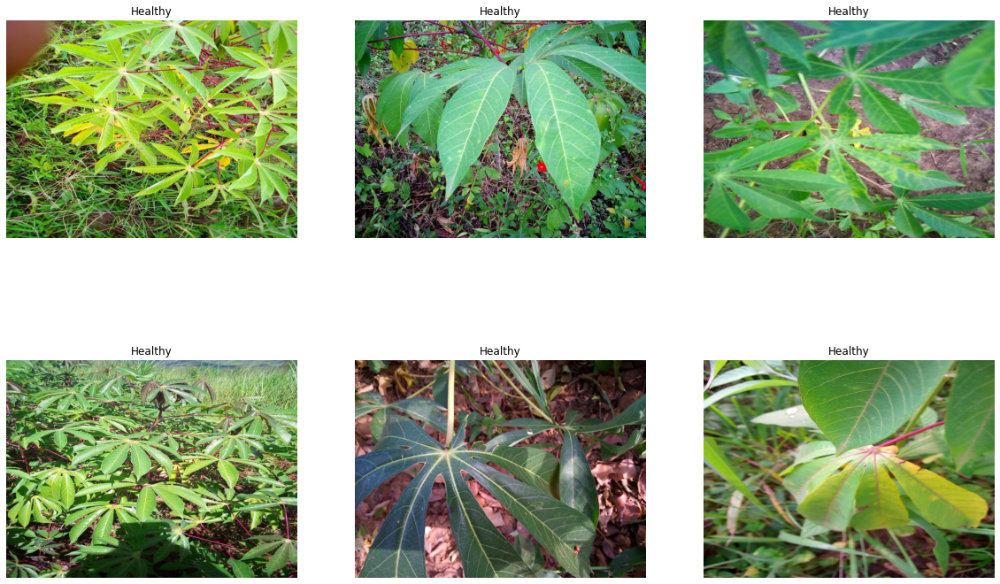

['3901047977.jpg', '1320526288.jpg', '958289716.jpg', '4179444530.jpg', '1095482483.jpg', '3059118065.jpg']


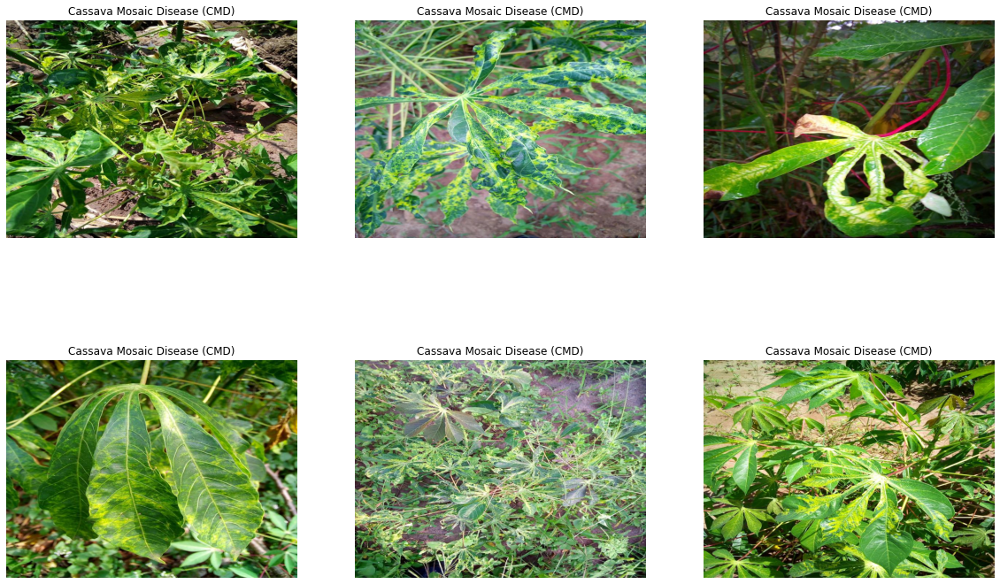

['227631164.jpg', '2565638908.jpg', '2421566220.jpg', '3755850035.jpg', '2571922041.jpg', '1288225954.jpg']


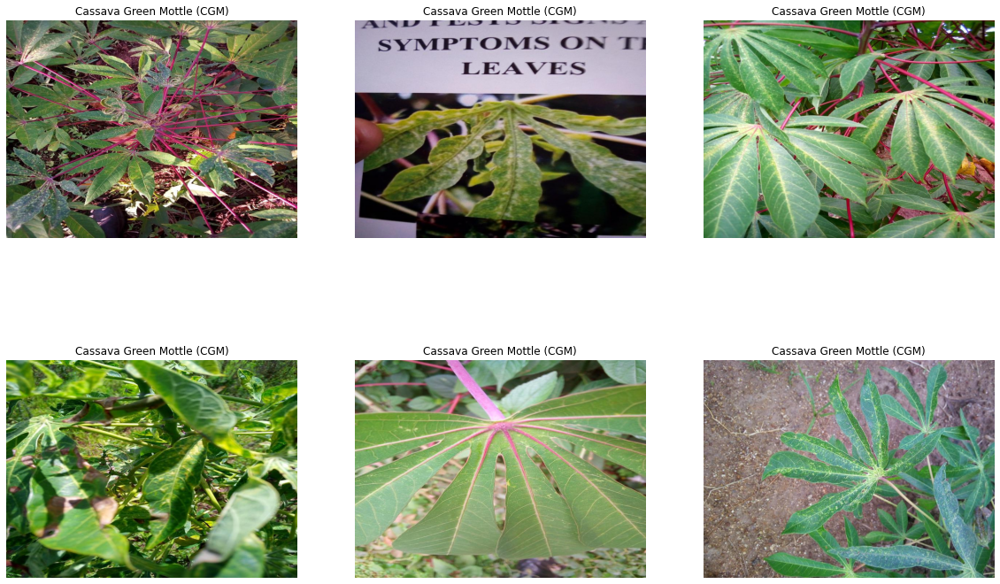

['230268028.jpg', '2557871369.jpg', '2682408847.jpg', '3703884740.jpg', '1355611441.jpg', '2207984247.jpg']


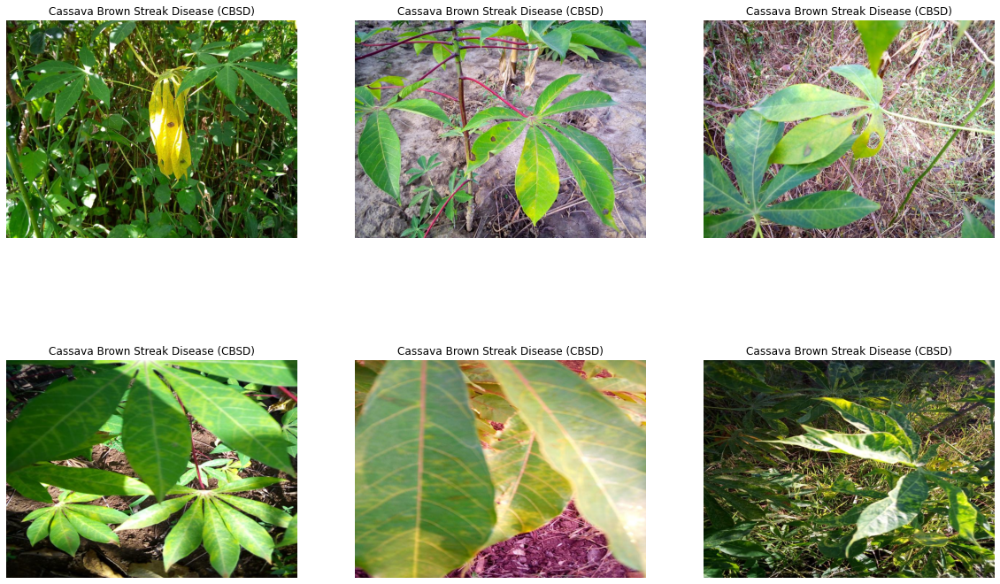

['4206587190.jpg', '2490112634.jpg', '798023657.jpg', '965919968.jpg', '3844780526.jpg', '2467892554.jpg']


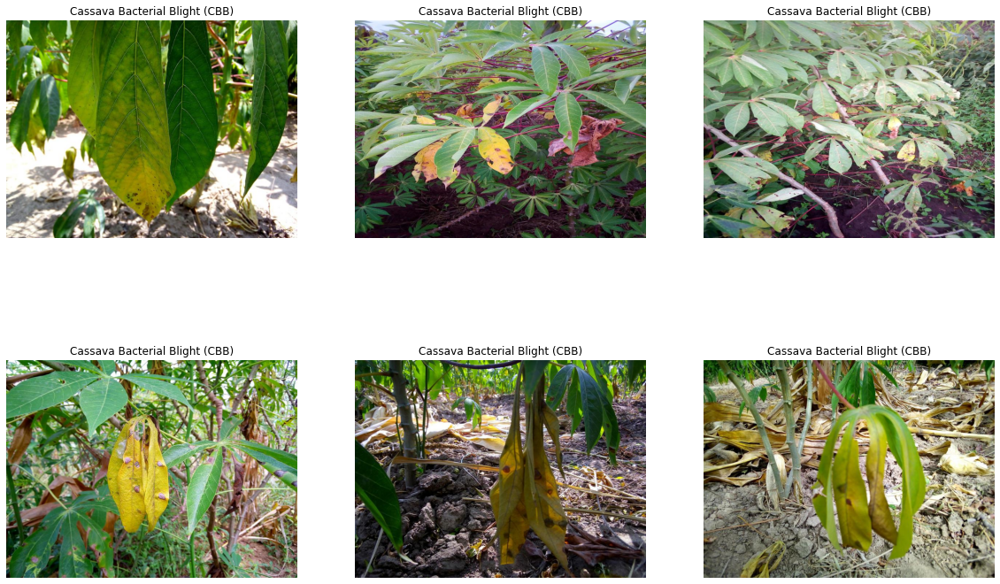

In [5]:
def plot_images(class_id, label, images_number,verbose=0):

    plot_list = df_train[df_train["label"] == class_id].sample(images_number)['image_id'].tolist()
    
    # Printing list of images
    if verbose:
        print(plot_list)
        
    labels = [label for i in range(len(plot_list))]
    size = np.sqrt(images_number)
    if int(size)*int(size) < images_number:
        size = int(size) + 1
        
    plt.figure(figsize=(20, 20))
    
    for ind, (image_id, label) in enumerate(zip(plot_list, labels)):
        plt.subplot(size, size, ind + 1)
        image = cv2.imread(os.path.join(path, "train_images", image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(label, fontsize=12)
        plt.axis("off")
    
    plt.show()


plot_images(class_id=4, 
    label='Healthy',
    images_number=6,
    verbose=1)

plot_images(class_id=3, 
    label='Cassava Mosaic Disease (CMD)',
    images_number=6,
    verbose=1)

plot_images(class_id=2, 
    label='Cassava Green Mottle (CGM)',
    images_number=6,
    verbose=1)

plot_images(class_id=1, 
    label='Cassava Brown Streak Disease (CBSD)',
    images_number=6,
    verbose=1)

plot_images(class_id=0, 
    label='Cassava Bacterial Blight (CBB)',
    images_number=6,
    verbose=1)

The pictures are not all correctly labeled. I saw some "Healthy" pictures which look like "CBB", and there are also some fruits.  
These components will cause problems for the ML model; garbage in - garbage out  
Normally I would try to identify and remove the wrongly labeled images, but i take part in the competition and if the test data for determining the accuracy have the same noise, my model will be worse.   
  
To find the right labels, I would prefer a k-means clustering. --> remove the "fruit" cluster, and have a look on the clusters. Maybe there will be some other diseases, or false labeled pictures.


The test data consists only one picture. So I will do a train-test-split on the training data set.  I split the data to 75%/25%

In [6]:
df_train.label = df_train.label.astype(str)

train_data_generator = ImageDataGenerator(
    rescale=1./255,   # all pixel values will be between 0 an 1
    shear_range=0.2, 
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function = preprocess_input,
    validation_split=0.25,
)

test_data_generator = ImageDataGenerator(
    rescale=1./255,   # all pixel values will be between 0 an 1
    #preprocessing_function = preprocess_input,
    #validation_split=0.25,
)

# Train- Test- Split
train_data_loader = train_data_generator.flow_from_dataframe(
    df_train,
    directory='../cassava-leaf-disease-classification/train_images/',
    x_col="image_id",
    y_col="label",
    target_size=(224, 224),
    subset='training',
    color_mode="rgb",
    class_mode="sparse"
)

val_data_loader = test_data_generator.flow_from_dataframe(
    df_train,
    directory='../cassava-leaf-disease-classification/train_images/',
    x_col="image_id",
    y_col="label",
    target_size=(224, 224),
    subset='validation',
    color_mode="rgb",
    class_mode="sparse"
)

Found 16048 validated image filenames belonging to 5 classes.
Found 0 validated image filenames belonging to 5 classes.


## Creating CNN

In [8]:

base_model = VGG16(
    include_top=True,
    weights='imagenet',
    input_shape=(image_size, image_size, 3)
)

# Freeze the layers (not the last 4)
for layer in base_model.layers[0:-4]:
    print(layer.name)
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in base_model.layers:
    print(layer, layer.trainable)



model = Sequential()
model.add(base_model) 

# Bildverarbeitungsteil erzeugen
#model.add(Conv2D(64, kernel_size=3, input_shape=(28, 28, 1), activation = 'relu'))
#model.add(MaxPool2D(pool_size=2))
#model.add(Dropout(0.2))
#model.add(Conv2D(32, kernel_size=3, activation = 'relu'))
#model.add(MaxPool2D(pool_size=2))

# Klassifizierungsteil des Netzes einfügen (Achtung: Nur einmal ausführen!)
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(5, activation='softmax'))

model.compile(optimizer = Adam(lr = 0.001),
                   loss = "sparse_categorical_crossentropy",
                   metrics = ["acc"])

model.summary()



input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x000001DAEDF849C8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001DAEE8AD3C8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001DAEE8AD8C8> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001DAEE8213C8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001DAEE85CDC8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001DAEDC1FD48> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001DAEDB96048> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001DAEC32AE88> False
<tensorflow.python.keras.layers.convolutional.Con

In [14]:
#model.load_weights('./basic_VGG16_imagenet.h5')

In [10]:
# Netz trainieren

train_steps = train_data_loader.samples / batch_size
valid_steps = val_data_loader.samples / batch_size

train_history = model.fit_generator(
    train_data_loader,
    validation_data=val_data_loader,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    epochs=10,
    verbose=1
)



  ...
    to  
  ['...']
Train for 250.75 steps
Epoch 1/10
251/250 [==============================] - 1328s 5s/step - loss: 1.1983 - acc: 0.6097
Epoch 2/10
251/250 [==============================] - 1315s 5s/step - loss: 1.1934 - acc: 0.6122
Epoch 3/10
251/250 [==============================] - 1311s 5s/step - loss: 1.1871 - acc: 0.6159
Epoch 4/10
251/250 [==============================] - 1315s 5s/step - loss: 1.1944 - acc: 0.6122
Epoch 5/10
251/250 [==============================] - 1319s 5s/step - loss: 1.1956 - acc: 0.6103
Epoch 6/10
251/250 [==============================] - 1316s 5s/step - loss: 1.1903 - acc: 0.6144
Epoch 7/10
251/250 [==============================] - 1321s 5s/step - loss: 1.1967 - acc: 0.6094
Epoch 8/10
251/250 [==============================] - 1320s 5s/step - loss: 1.1875 - acc: 0.6159
Epoch 9/10
251/250 [==============================] - 1321s 5s/step - loss: 1.1934 - acc: 0.6133
Epoch 10/10
251/250 [==============================] - 1315s 5s/step - loss: 1.

## Evaluation



In [47]:
model.save('./basic_VGG16_imagenet.h5')

# Making predictions
Now that we've trained our model we can use it to make predictions! 

In [ ]:
# this code will convert our test image data to a float32 
def to_float32(image, label):
    return tf.cast(image, tf.float32), label

In [ ]:
test_ds = get_test_dataset(ordered=True) 
test_ds = test_ds.map(to_float32)

print('Computing predictions...')
test_images_ds = testing_dataset
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

# Creating a submission file
Now that we've trained a model and made predictions we're ready to submit to the competition! You can run the following code below to get your submission file.

In [ ]:
print('Generating submission.csv file...')
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('submission.csv', np.rec.fromarrays([test_ids, predictions]), fmt=['%s', '%d'], delimiter=',', header='id,label', comments='')
!head submission.csv

Be aware that because this is a code competition with a hidden test set, internet and TPUs cannot be enabled on your submission notebook. Therefore TPUs will only be available for training models. For a walk-through on how to train on TPUs and run inference/submit on GPUs, see our [TPU Docs](https://www.kaggle.com/docs/tpu#tpu6).